In this notebook moview reviews from TMDB Movies Dataset 2023 will be analysed.

In [3]:
!unzip ../Data/df.zip

Archive:  ../Data/df_normalized.zip
  inflating: df_normalized.csv       


In [4]:
import pandas as pd

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud

nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')


Read raw data

In [9]:
df = pd.read_csv("df.csv", sep=";")

We are interested in an overview column

In [13]:
df.overview

0         Cobb, a skilled thief who commits corporate es...
1         The adventures of a group of explorers who mak...
2         Batman raises the stakes in his war on crime. ...
3         In the 22nd century, a paraplegic Marine is di...
4         When an unexpected enemy emerges and threatens...
                                ...                        
337507    Stand In is apart of a four part series called...
337508       White girls lovin' that black pussy! Volume 8.
337509                                                  NaN
337510    The old west range war story transported to Ge...
337511    Our hero Kim is a police inspector who must ar...
Name: overview, Length: 337512, dtype: object

Drop movies without overview

In [ ]:
df.dropna(subset=["overview"], inplace=True)

Prepocess data following this scheme:
1) Lower all letters
2) Tokenize texts
3) Delete all characters except letters
4) Lemmatise texts
5) Delete stop-words

In [20]:
stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to /home/dangerio/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /home/dangerio/nltk_data...
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/dangerio/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [21]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [49]:
df["overview_tokenized"] = df.overview.apply(preprocess)

Split sample on train and test

In [54]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
            df[["overview_tokenized"]], df["vote_average"],
            test_size=0.2, random_state=42
    )

Wordcloud of all overviews in train sample

In [ ]:
def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

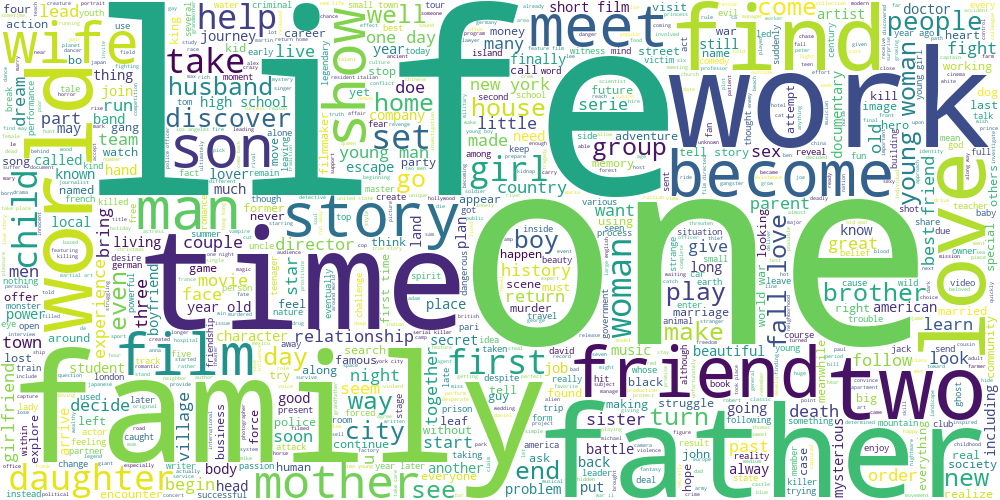

In [55]:
draw_wordcloud(X_train["overview_tokenized"])

Make K-Means clusterisation using tf-idf representation of texts and draw wordcloud of each cluster

/home/dangerio/miniconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster 0 wordcloud


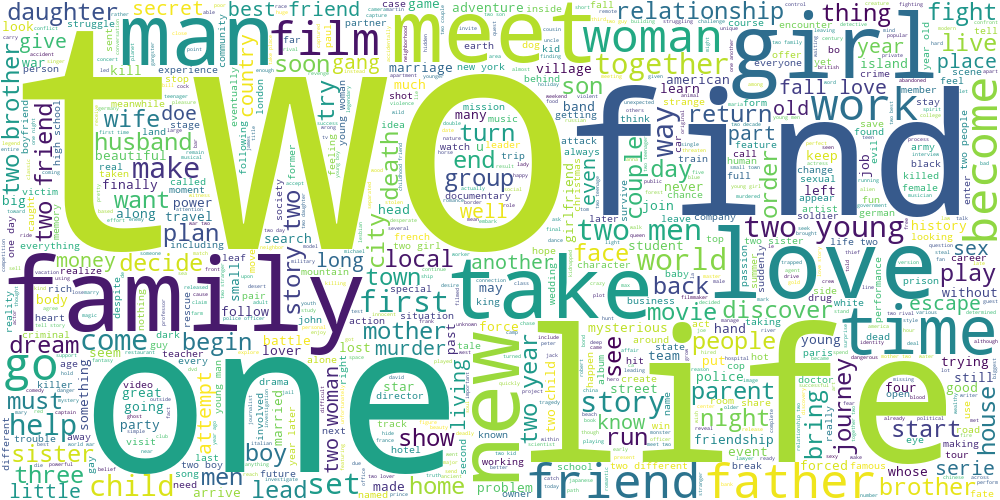


Cluster 1 wordcloud


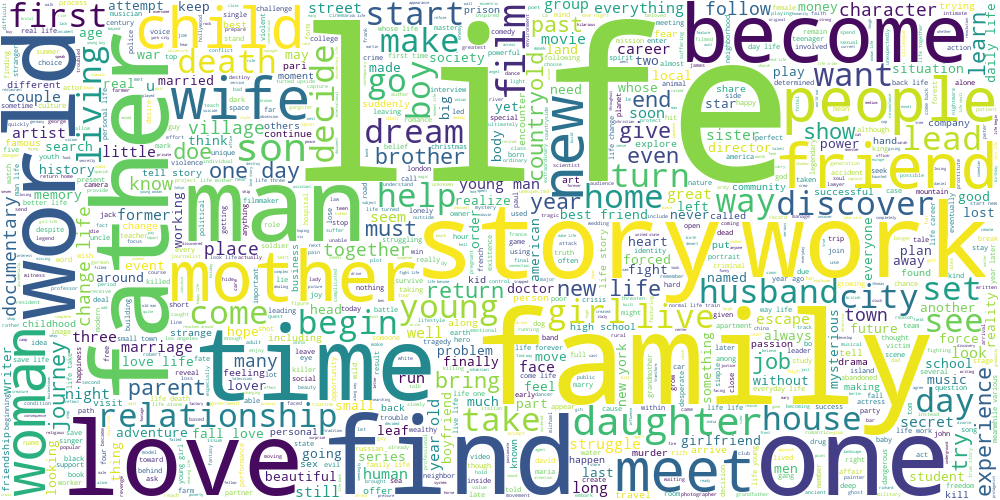


Cluster 2 wordcloud


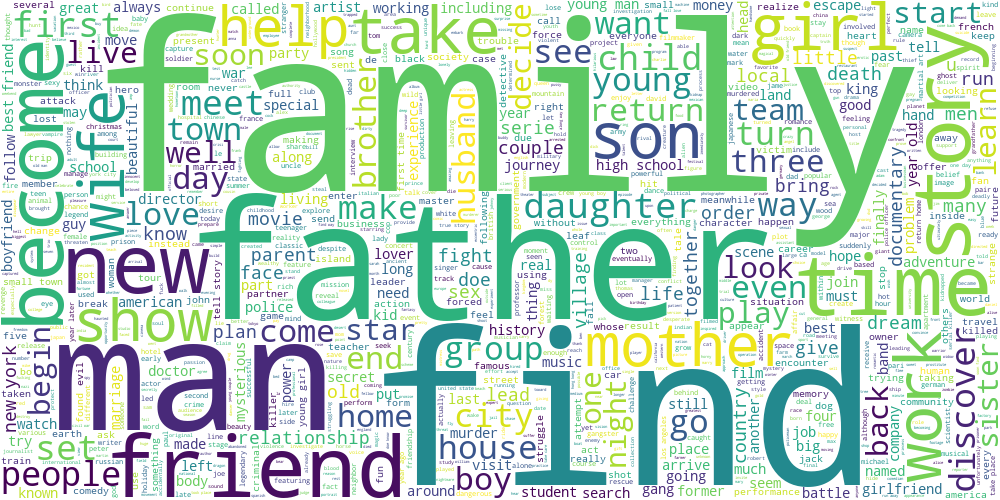


Cluster 3 wordcloud


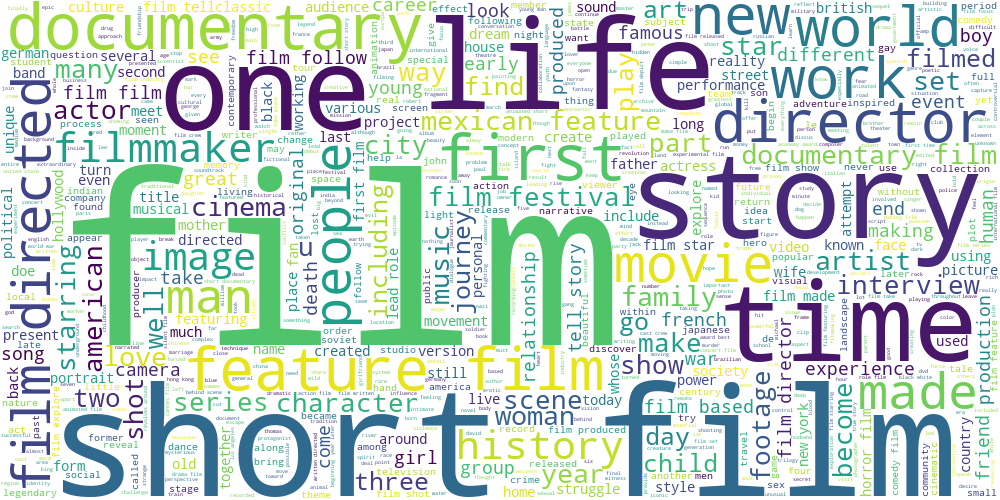


Cluster 4 wordcloud


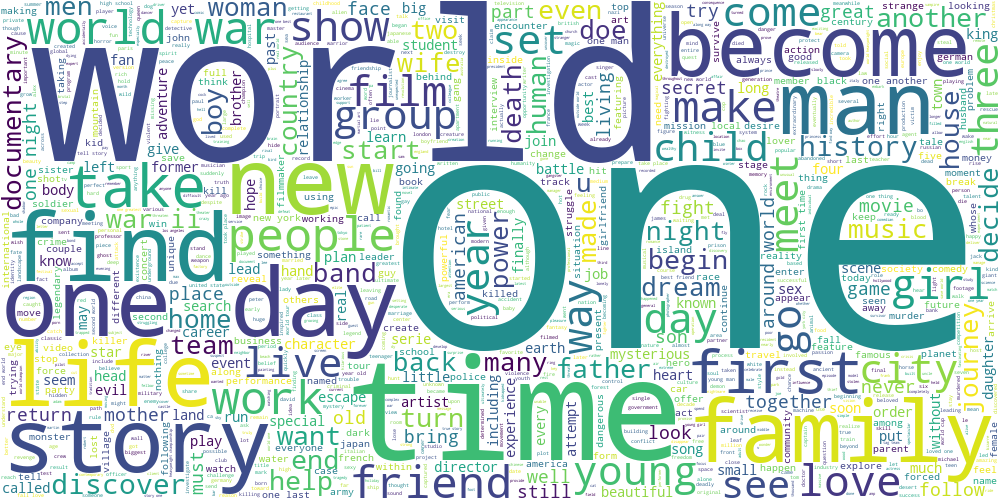


Cluster 5 wordcloud


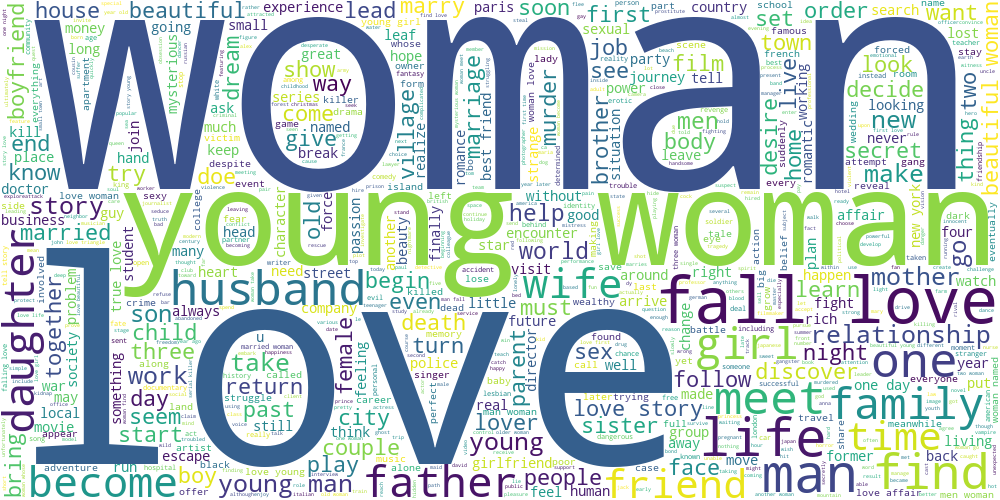

In [80]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from collections import Counter
from scipy import sparse
X = X_train["overview_tokenized"]
tfidf = TfidfVectorizer(min_df=0.02)
X_tr = sparse.csc_matrix.toarray(tfidf.fit_transform(X))

kmeans = KMeans(n_clusters=6, random_state=59)
kmeans_cl = kmeans.fit_predict(X_tr)

for cl_label in set(list(kmeans_cl)):
    print(f'Cluster {cl_label} wordcloud')
    display(draw_wordcloud(X[kmeans_cl == cl_label]))
    print()

In addition, we can find a topic of each cluster by taking tf-idf argmax of corresponding cluster center

In [81]:
tfidf_voc = tfidf.vocabulary_
idx_to_word = {idx:word for (word, idx) in tfidf_voc.items()}

cl_centers = kmeans.cluster_centers_
cl_maxword_idx = list(cl_centers.argmax(axis=1))
cl_maxword = [idx_to_word[idx] for idx in cl_maxword_idx]

for i, item in enumerate(cl_maxword):
    print(f'Cluster {i} topic word is {item}')

Cluster 0 topic word is two
Cluster 1 topic word is life
Cluster 2 topic word is get
Cluster 3 topic word is film
Cluster 4 topic word is one
Cluster 5 topic word is woman


In [85]:
# from sklearn.cluster import SpectralClustering
# from sklearn.manifold import TSNE
# import seaborn as sns
# sns.set_style('darkgrid')

# kmeans = KMeans(n_clusters=6, random_state=59)
# kmeans_cl = kmeans.fit_predict(X_tr)

# X_embedded = TSNE(n_components=2, init='random',
#                    perplexity=30, random_state=59).fit_transform(X_tr)

# fig, ax = plt.subplots(figsize=(21, 7))

# fig.suptitle('Partitioning into clusters of K-means, TSNE 2d projection')
# sns.scatterplot(x=X_embedded[:, 0], y=X_embedded[:, 1],
#              ax=ax[i], palette=sns.color_palette("hls", 8))
# ax.set_title("K-Means")


Estimate LDA model on subsample and draw wordcloud for each topic predicted by LDA

Topic 0 wordcloud


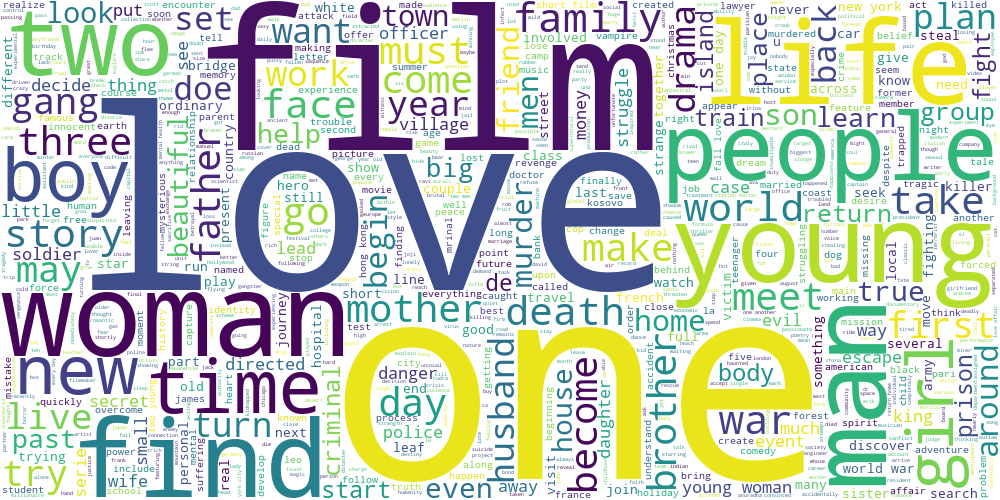


Topic 1 wordcloud


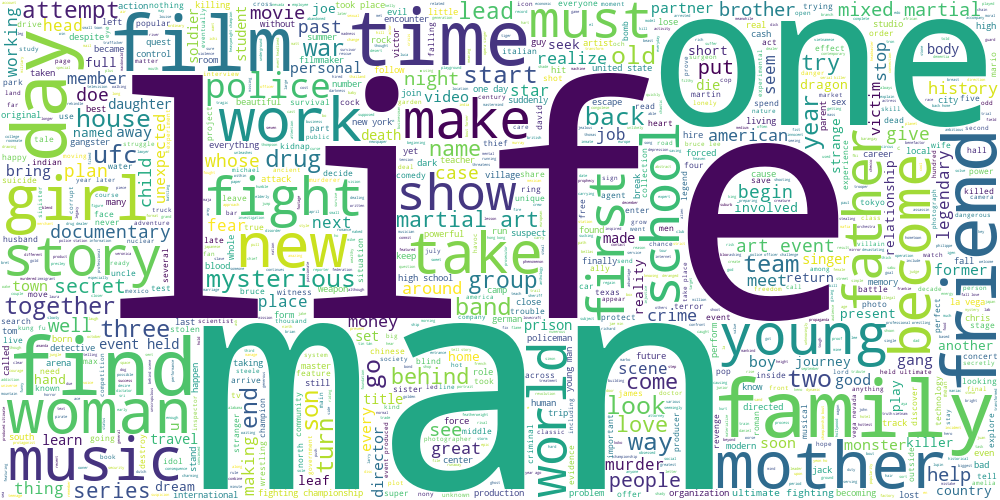


Topic 2 wordcloud


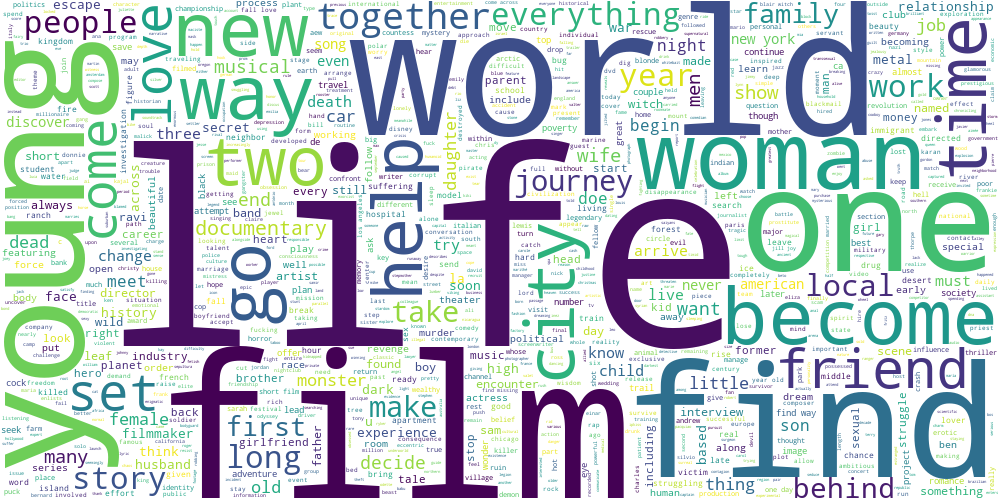


Topic 3 wordcloud


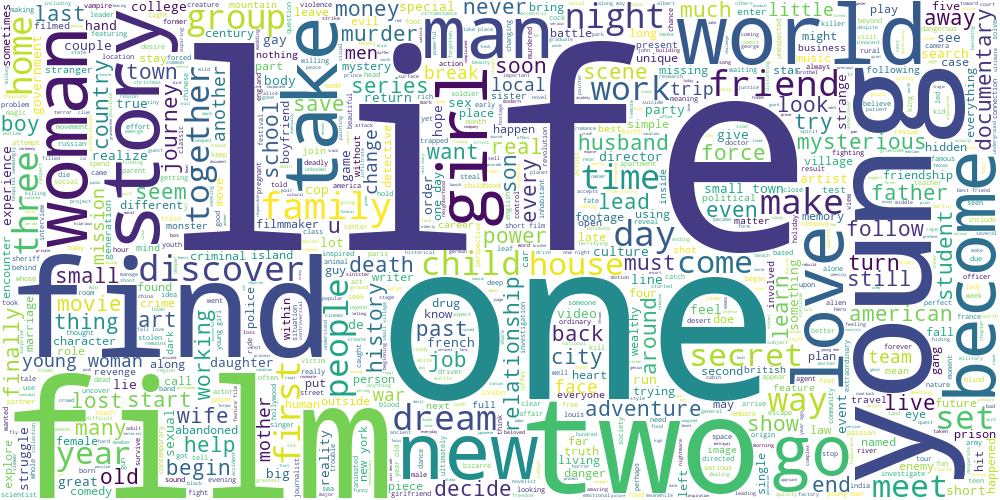


Topic 4 wordcloud


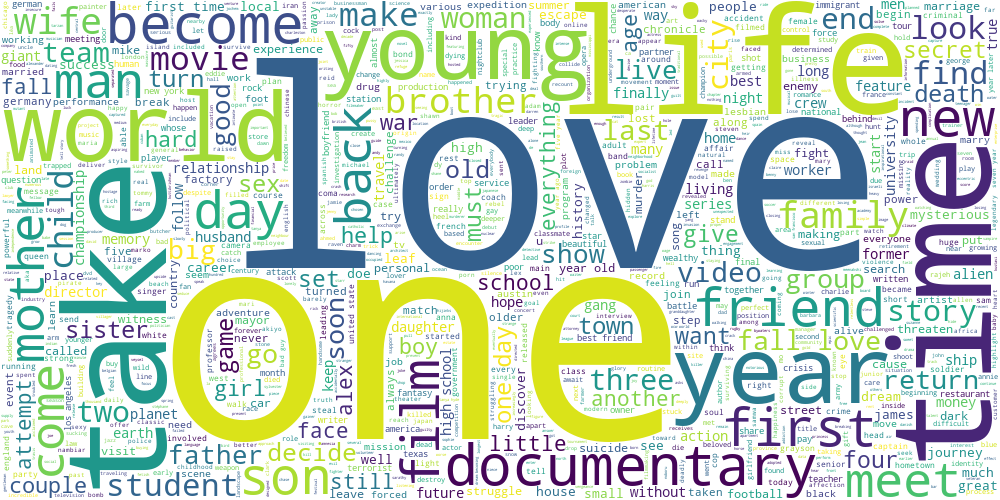


Topic 5 wordcloud


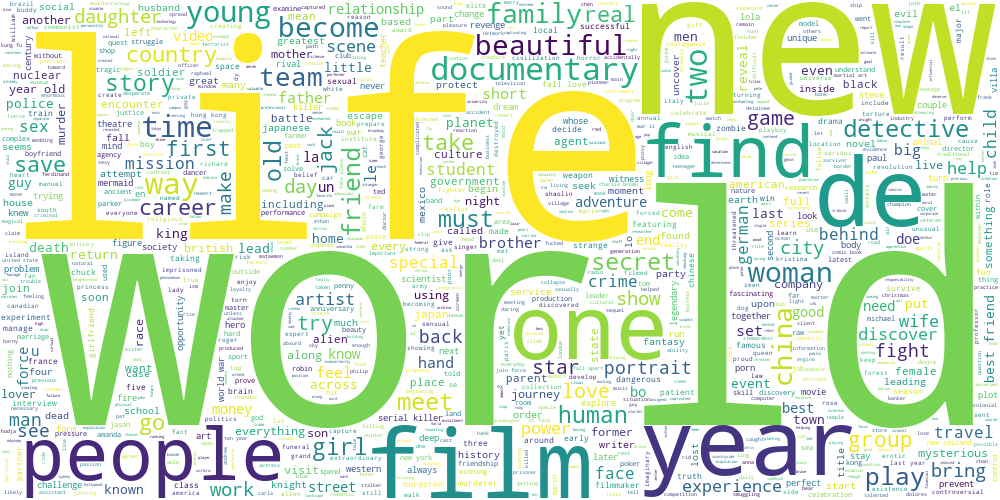


Topic 6 wordcloud


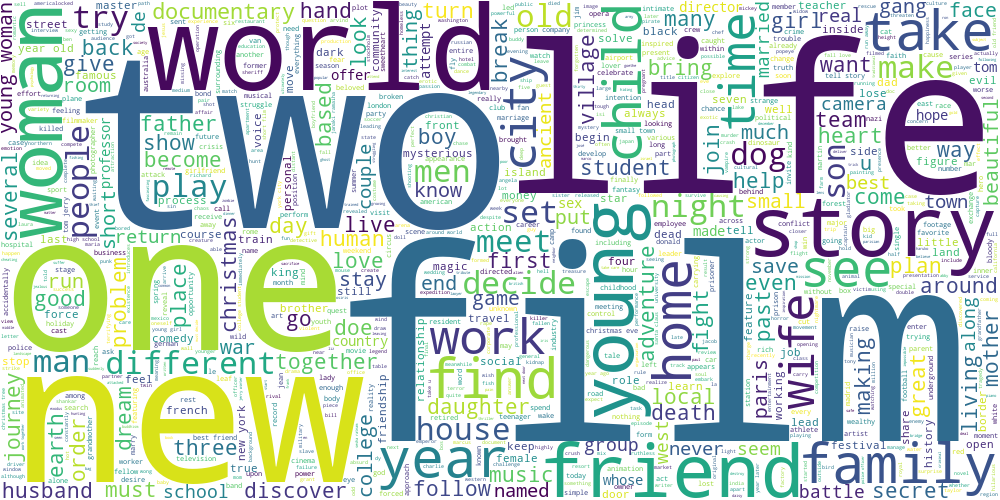


Topic 7 wordcloud


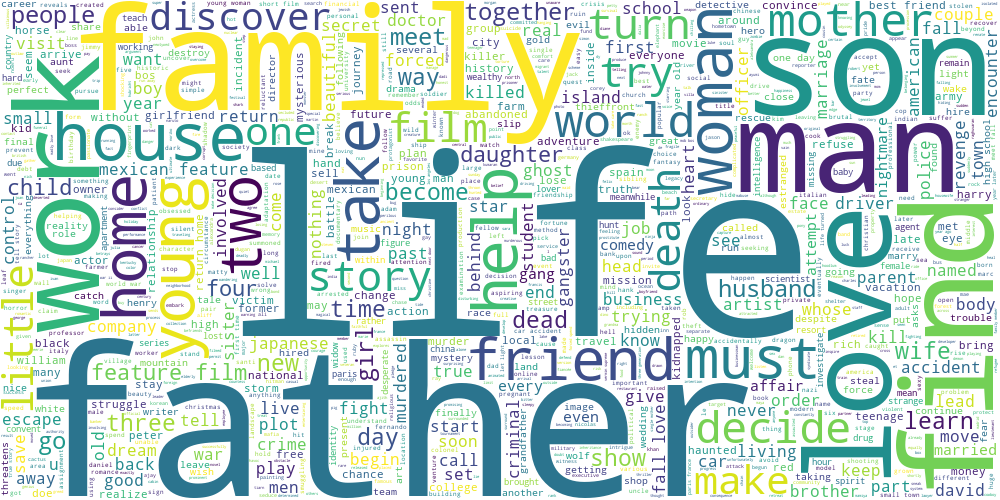


Topic 8 wordcloud


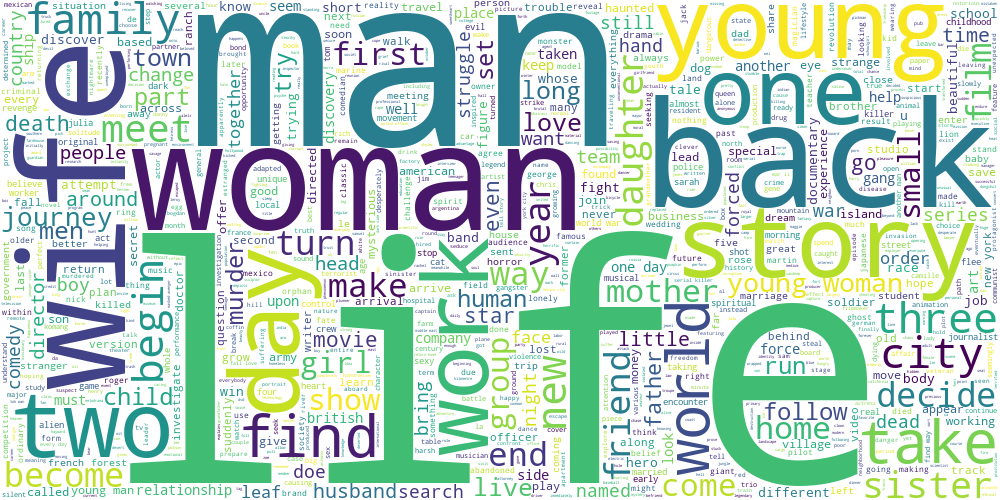


Topic 9 wordcloud


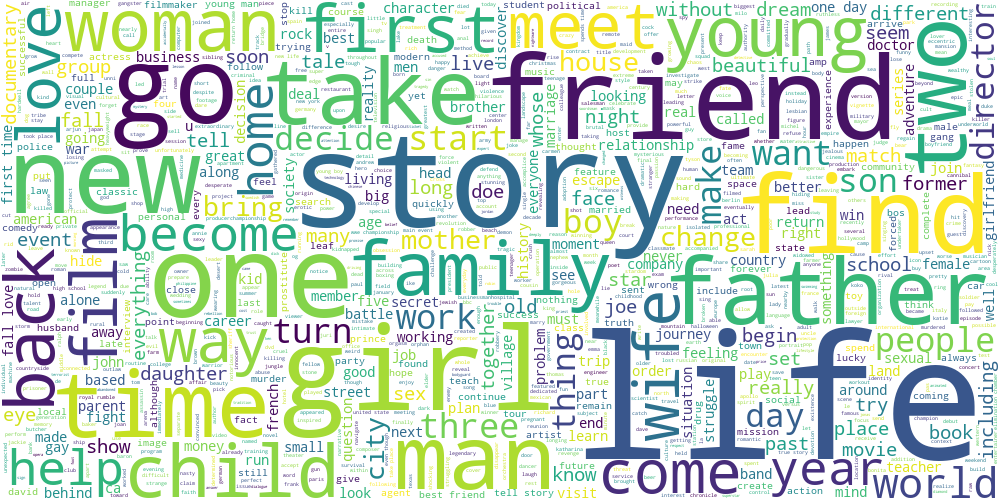


Topic 10 wordcloud


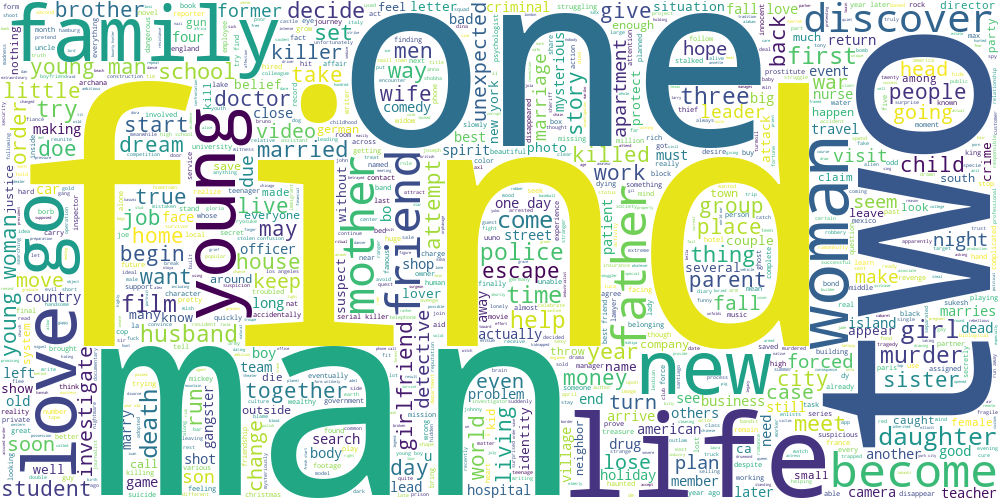


Topic 11 wordcloud


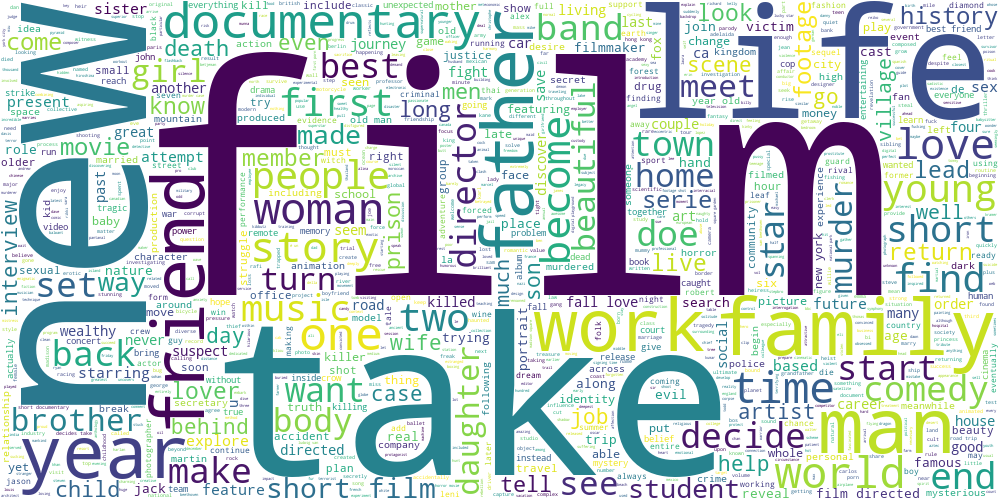


Topic 12 wordcloud


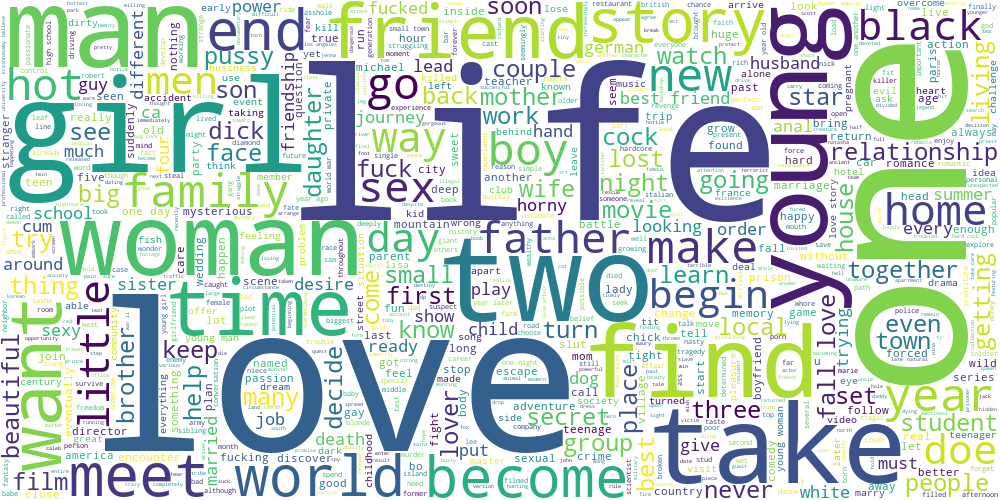


Topic 13 wordcloud


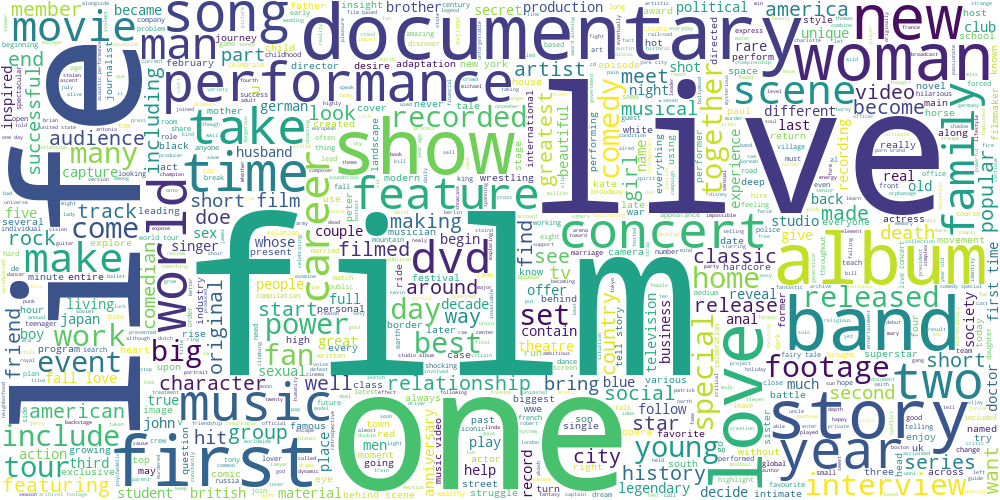


Topic 14 wordcloud


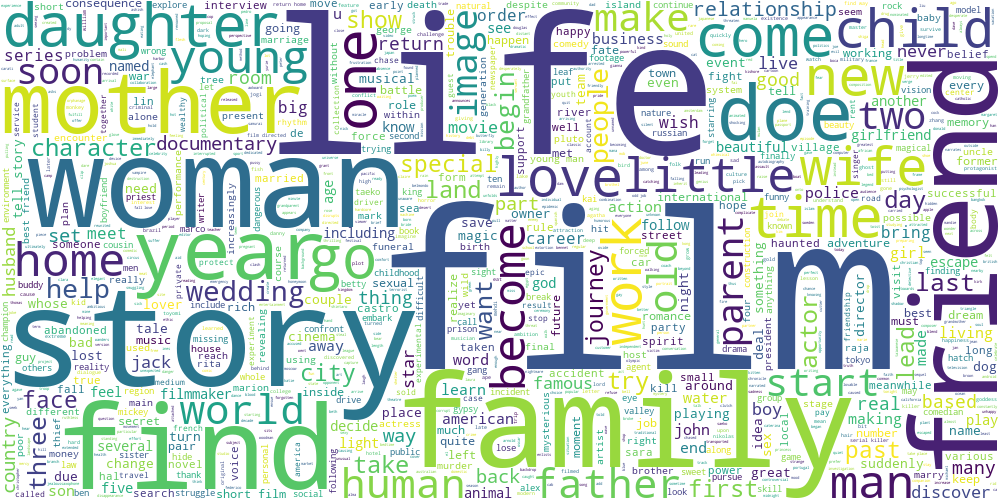


Topic 15 wordcloud


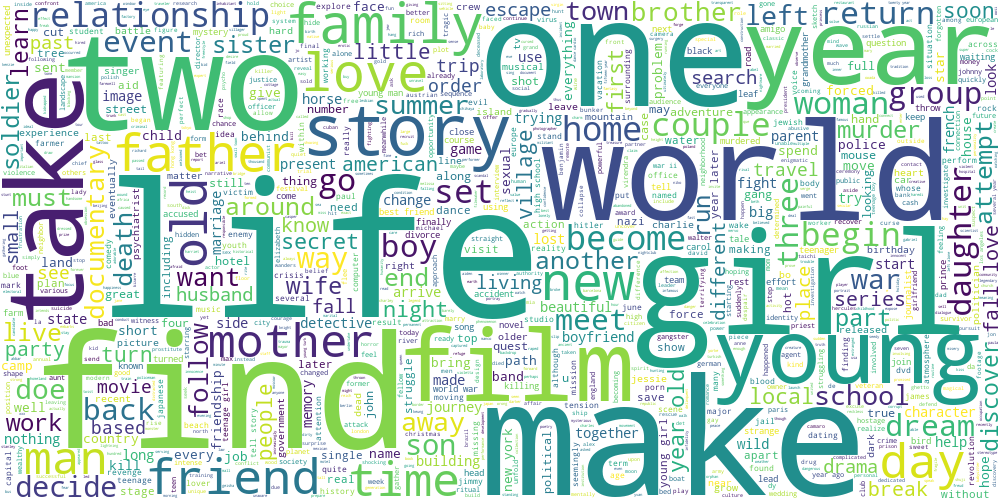

In [95]:
X_sub = X.sample(10000, random_state=59)
X_tr_bow = CountVectorizer().fit_transform(X_sub)
lda = LatentDirichletAllocation(n_components=16,
                                random_state=59)
X_topics_dist = lda.fit_transform(X_tr_bow)
X_topics = X_topics_dist.argmax(axis=1)

succ_topics = range(16)
for cl_label in succ_topics:
    print(f'Topic {cl_label} wordcloud')
    display(draw_wordcloud(X_sub[X_topics == cl_label]))
    print()